In [14]:
import pandas as pd
import csv
import os
import matplotlib.pyplot as plt
import numpy as np



In [15]:
print("Current Working Directory: ", os.getcwd())

Current Working Directory:  /home/tiantan/Documents/Apriltag_distance_detection/utils


In [16]:
path = '/home/tiantan/Documents/Apriltag_distance_detection/data/box_tian height-33.5inches.csv'

In [24]:
import csv

# Open the CSV file
with open(path, mode='r') as file:
    # Create a CSV reader
    csv_reader = csv.reader(file)
    
    # Skip the header if necessary
    next(csv_reader)
    
    # Process each row
    for row in csv_reader:
        print(row)  # Each row is a list of fields


[]
['', '', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body', 'Rigid Body']
['', '', 'Boat_11', 'Boat_11', 'Boat_11', 'Boat_11', 'Boat_11', 'Boat_11', 'Boat_11', 'Tian', 'Tian', 'Tian', 'Tian', 'Tian', 'Tian', 'Tian']
['', '', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', 'DBFC8FF3EAE411EEFB9A23B13260E7AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB']
['', '', 'Rotation', 'Rotation', 'Rotation', 'Rotation', 'Position', 'Position', 'Position', 'Rotation', 'Rotation', 'Rotation', 'Rotatio

In [19]:
data = []
with open(path, 'r') as file:
    csv_reader = csv.reader(file)
    next(csv_reader)  # Skip the header row
    for row in csv_reader:
        # Extract Time and last X, Y, Z positions
        if len(row) >= 8:  # Check if row has enough columns
            time = row[1]  # Time at the second column
            x_position = row[-3]  # X position in the third last column
            y_position = row[-2]  # Y position in the second last column
            z_position = row[-1]  # Z position in the last column
            data.append((time, x_position, y_position, z_position))

# Print extracted data
for item in data:
    print(item)

('', 'Rigid Body', 'Rigid Body', 'Rigid Body')
('', 'Tian', 'Tian', 'Tian')
('', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB', '8948A8BD033E11EFFB9A23B13260E9AB')
('', 'Position', 'Position', 'Position')
('Time (Seconds)', 'X', 'Y', 'Z')
('0.000000', '0.279608', '-0.282152', '1.479095')
('0.008333', '0.278633', '-0.282210', '1.479575')
('0.016667', '0.277592', '-0.282278', '1.480107')
('0.025000', '0.276559', '-0.282327', '1.480720')
('0.033333', '0.275517', '-0.282414', '1.481355')
('0.041667', '0.274596', '-0.282442', '1.481928')
('0.050000', '0.273731', '-0.282466', '1.482512')
('0.058333', '0.272911', '-0.282509', '1.483081')
('0.066667', '0.272181', '-0.282537', '1.483670')
('0.075000', '0.271515', '-0.282552', '1.484340')
('0.083333', '0.270850', '-0.282602', '1.484942')
('0.091667', '0.270214', '-0.282633', '1.485433')
('0.100000', '0.269592', '-0.282692', '1.485774')
('0.108333', '0.269021', '-0.282759', '1.485975')
('0.116667', '0.268521', '-0.282785'

In [20]:
data = []
box_data = []  # This will store the [time, distance] pairs

# Variables to compute averages
total_x, total_y, total_z, total_distance = 0, 0, 0, 0
count = 0

try:
    with open(path, 'r') as file:
        csv_reader = csv.reader(file)
        next(csv_reader)  # Skip the header row
        for row in csv_reader:
            if len(row) >= 8:  # Ensure there are enough columns
                try:
                    time_box = float(row[1].replace("'", "").replace(",", "").strip())
                    x_position_box = float(row[-3].replace("'", "").replace(",", "").strip())
                    y_position_box = float(row[-2].replace("'", "").replace(",", "").strip())
                    z_position_box = float(row[-1].replace("'", "").replace(",", "").strip())
                    distance_box = np.sqrt(x_position_box**2 + y_position_box**2 + z_position_box**2)

                    # Accumulate sums for averaging
                    total_x += x_position_box
                    total_y += y_position_box
                    total_z += z_position_box
                    total_distance += distance_box
                    count += 1

                    data.append([time_box, x_position_box, y_position_box, z_position_box])
                    box_data.append([time_box, distance_box])  # Append [time, distance] to box_data
                except ValueError:
                    # Skip rows where conversion to float fails
                    continue
except FileNotFoundError:
    print("The file was not found. Check the file path and try again.")
except Exception as e:
    print(f"An error occurred: {e}")

# Print the cleaned and converted data
for item in data:
    print(item)

# Print the time and distance data
print("\nTime and Distance Data:")
for item in box_data:
    print(item)

# Calculate averages if count is not zero
avg_x = total_x / count if count > 0 else 0
avg_y = total_y / count if count > 0 else 0
avg_z = total_z / count if count > 0 else 0
avg_distance = total_distance / count if count > 0 else 0

# Print average values
print("\nAverage Values:")
print(f"Average X: {avg_x}")
print(f"Average Y: {avg_y}")
print(f"Average Z: {avg_z}")


[0.0, 0.279608, -0.282152, 1.479095]
[0.008333, 0.278633, -0.28221, 1.479575]
[0.016667, 0.277592, -0.282278, 1.480107]
[0.025, 0.276559, -0.282327, 1.48072]
[0.033333, 0.275517, -0.282414, 1.481355]
[0.041667, 0.274596, -0.282442, 1.481928]
[0.05, 0.273731, -0.282466, 1.482512]
[0.058333, 0.272911, -0.282509, 1.483081]
[0.066667, 0.272181, -0.282537, 1.48367]
[0.075, 0.271515, -0.282552, 1.48434]
[0.083333, 0.27085, -0.282602, 1.484942]
[0.091667, 0.270214, -0.282633, 1.485433]
[0.1, 0.269592, -0.282692, 1.485774]
[0.108333, 0.269021, -0.282759, 1.485975]
[0.116667, 0.268521, -0.282785, 1.486062]
[0.125, 0.268102, -0.282834, 1.486094]
[0.133333, 0.267807, -0.282864, 1.486174]
[0.141667, 0.267675, -0.282848, 1.486373]
[0.15, 0.26769, -0.282856, 1.486651]
[0.158333, 0.267872, -0.282806, 1.487002]
[0.166667, 0.268113, -0.282813, 1.487343]
[0.175, 0.268428, -0.282755, 1.487686]
[0.183333, 0.268716, -0.282702, 1.487976]
[0.191667, 0.268878, -0.282704, 1.488245]
[0.2, 0.268946, -0.282706, 1

In [9]:
""" BOX DATA
Average X: 0.3005700284810129
Average Z: 1.4883423132911402
"""


' BOX DATA\nAverage X: 0.3005700284810129\nAverage Z: 1.4883423132911402\n'

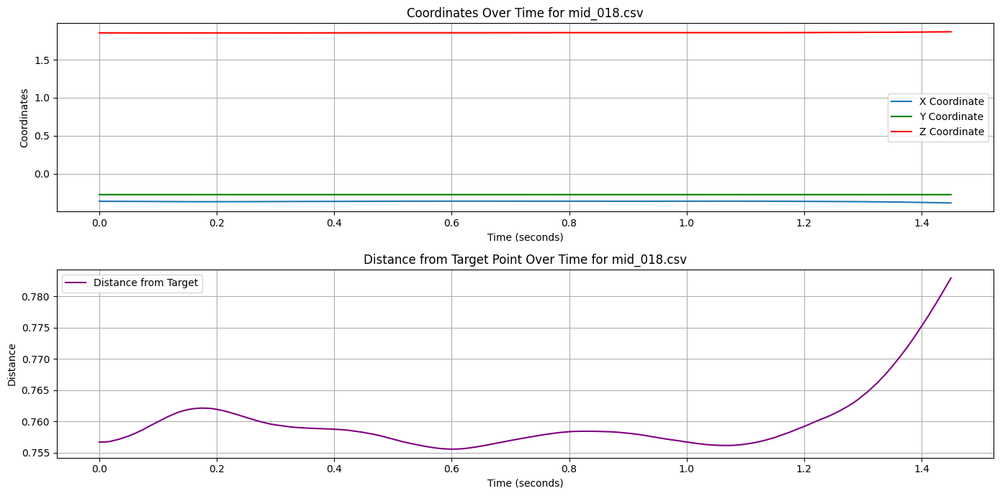

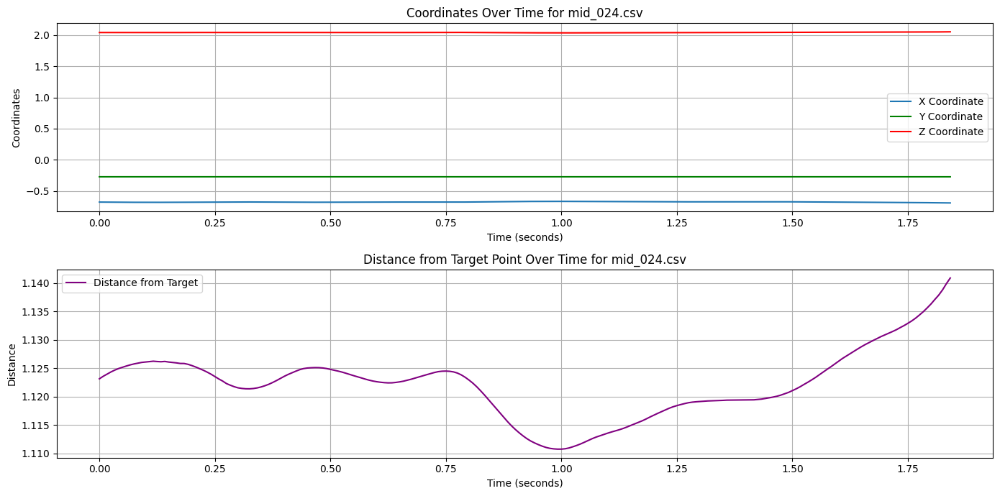

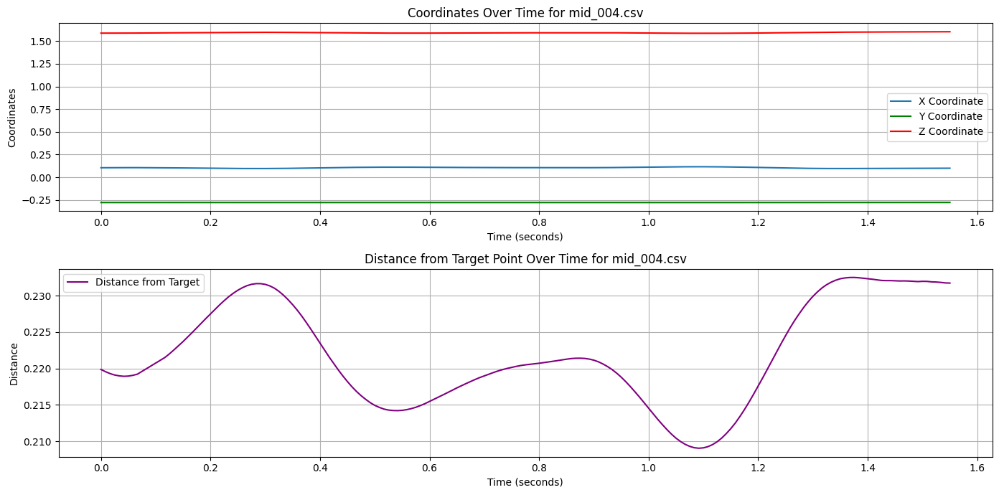

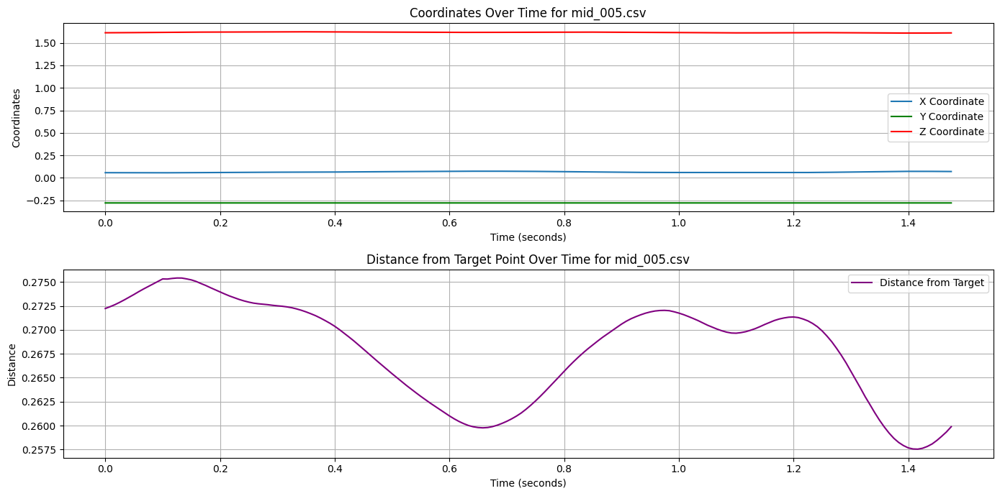

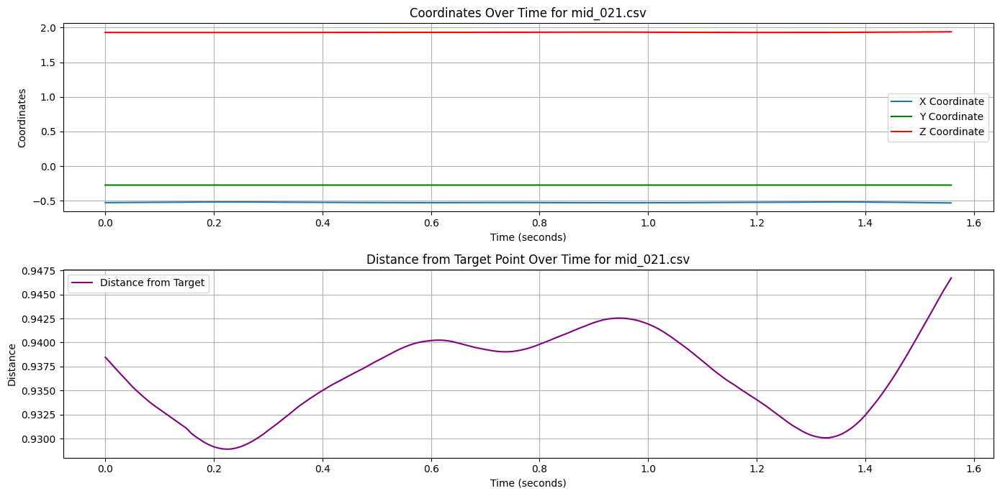

...

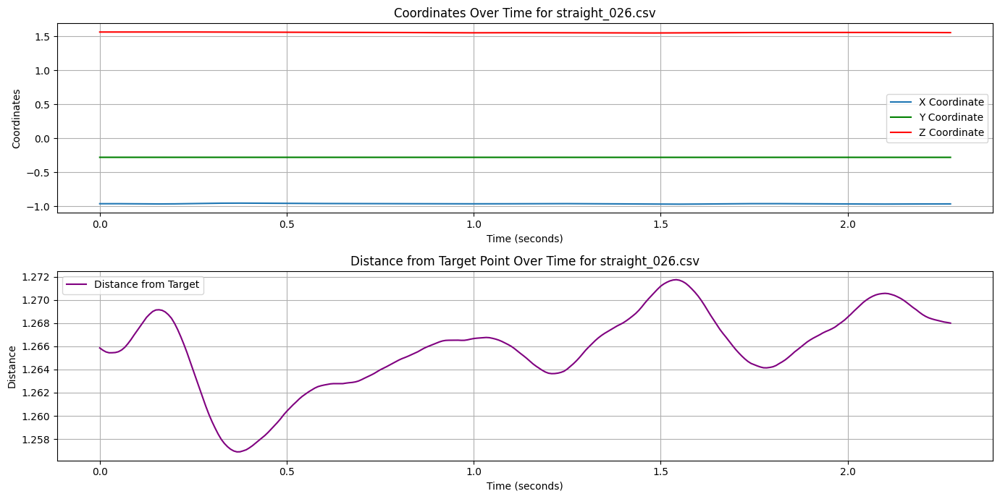

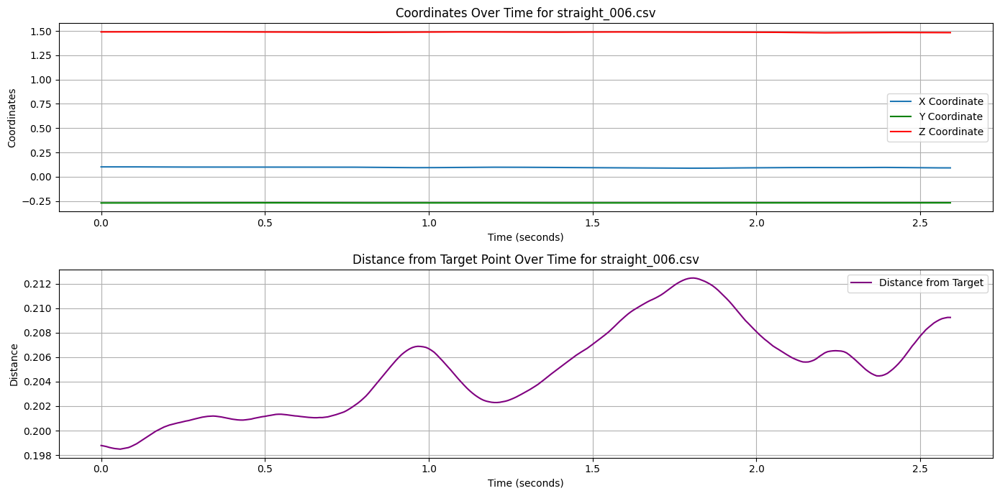

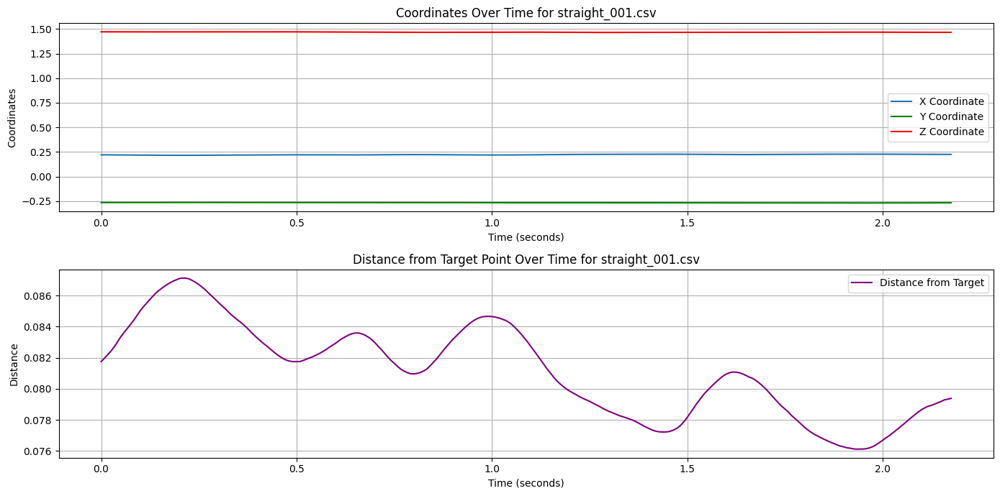

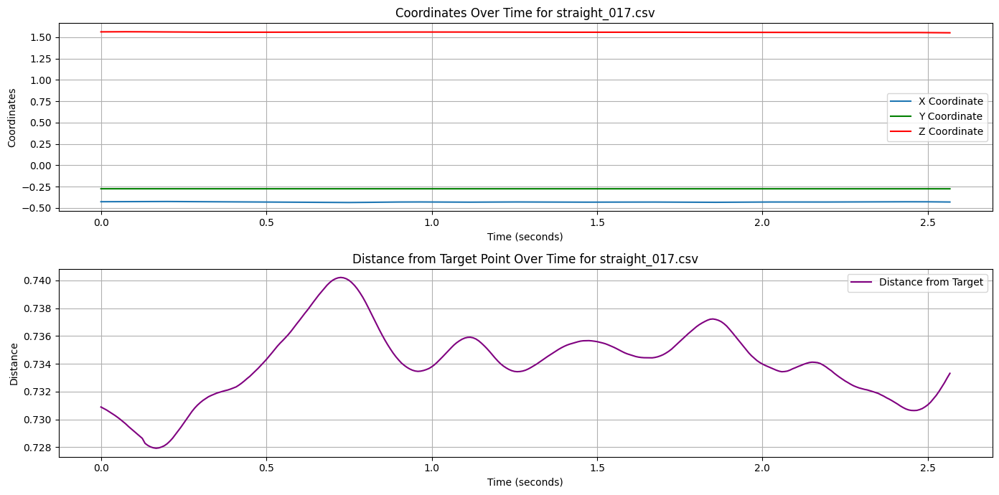

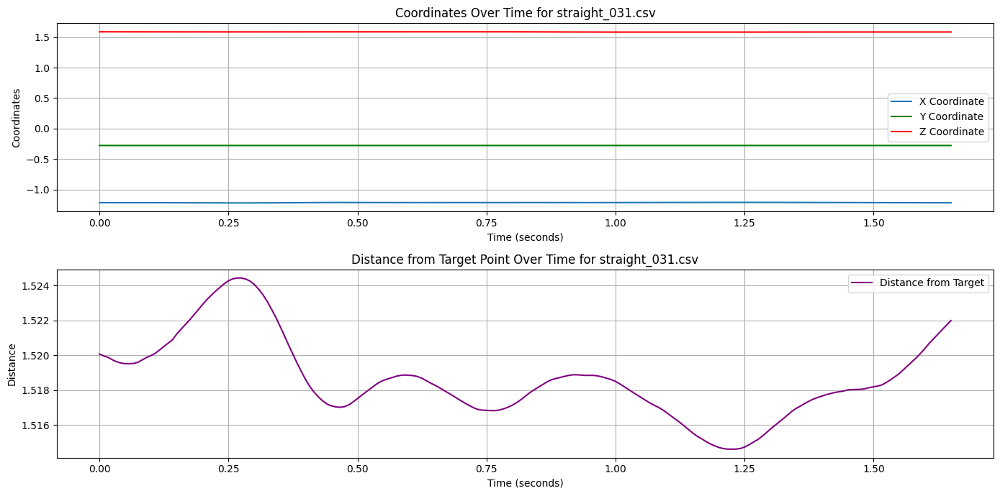

In [10]:
# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/mid_4_25',
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/small_4_25',
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/straight_4_25'
}

# Target average coordinates for distance calculation
target_x = 0.3005700284810129
target_z = 1.4883423132911402

def process_csv_files_in_folder(folder, label):
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                time = float(row[1])  # Time at the second column
                                x = float(row[-3])  # X position in the third last column
                                y = float(row[-2])  # Y position in the second last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append([time, x, y, z])
                            except ValueError:
                                continue

                if file_data:
                    # Process individual file data
                    times = [data[0] for data in file_data]
                    xs = [data[1] for data in file_data]
                    ys = [data[2] for data in file_data]
                    zs = [data[3] for data in file_data]

                    # Calculate distances from the target point using X and Z
                    distances = np.sqrt((np.array(xs) - target_x)**2 + (np.array(zs) - target_z)**2)

                    # Plotting coordinates over time
                    plt.figure(figsize=(14, 7))
                    plt.subplot(211)
                    plt.plot(times, xs, label='X Coordinate')
                    plt.plot(times, ys, label='Y Coordinate', color='green')
                    plt.plot(times, zs, label='Z Coordinate', color='red')
                    plt.xlabel('Time (seconds)')
                    plt.ylabel('Coordinates')
                    plt.title(f'Coordinates Over Time for {filename}')
                    plt.legend()
                    plt.grid(True)

                    # Plotting distance from target over time
                    plt.subplot(212)
                    plt.plot(times, distances, label='Distance from Target', color='purple')
                    plt.xlabel('Time (seconds)')
                    plt.ylabel('Distance')
                    plt.title(f'Distance from Target Point Over Time for {filename}')
                    plt.legend()
                    plt.grid(True)

                    plt.tight_layout()
                    plt.show()

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

# Process each directory
for label, folder_path in paths.items():
    process_csv_files_in_folder(folder_path, label)

In [11]:
# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/mid_4_25',
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/small_4_25',
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/straight_4_25'
}

# Target average coordinates for distance calculation
target_x = 0.3005700284810129
target_z = 1.4883423132911402

# Prepare a dictionary to hold distance results for each file
distance_results = {}

def process_csv_files_in_folder(folder, label):
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                time = float(row[1])  # Time at the second column
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[f'{label} #{filename}'] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

# Process each directory
for label, folder_path in paths.items():
    process_csv_files_in_folder(folder_path, label)

# Print results in a tabular format
print("File Name", "Average Distance")
for key, value in distance_results.items():
    print(key, f"{value:.2f}")


File Name Average Distance
mid_angle #mid_018.csv 0.76
mid_angle #mid_024.csv 1.12
mid_angle #mid_004.csv 0.22
mid_angle #mid_005.csv 0.27
mid_angle #mid_021.csv 0.94
mid_angle #mid_016.csv 0.68
mid_angle #mid_011.csv 0.47
mid_angle #mid_012.csv 0.49
mid_angle #mid_002.csv 0.12
mid_angle #mid_028.csv 1.29
mid_angle #mid_022.csv 1.00
mid_angle #mid_032.csv 1.53
mid_angle #mid_010.csv 0.45
mid_angle #mid_020.csv 0.88
mid_angle #mid_023.csv 1.05
mid_angle #mid_019.csv 0.85
mid_angle #mid_025.csv 1.14
mid_angle #mid_003.csv 0.17
mid_angle #mid_027.csv 1.24
mid_angle #mid_029.csv 1.34
mid_angle #mid_013.csv 0.53
mid_angle #mid_007.csv 0.27
mid_angle #mid_009.csv 0.35
mid_angle #mid_017.csv 0.71
mid_angle #mid_030.csv 1.41
mid_angle #mid_006.csv 0.32
mid_angle #mid_000.csv 0.02
mid_angle #mid_008.csv 0.30
mid_angle #mid_015.csv 0.61
mid_angle #mid_031.csv 1.47
mid_angle #mid_001.csv 0.09
mid_angle #mid_026.csv 1.20
mid_angle #mid_014.csv 0.55
small_angle #small_010.csv 0.54
small_angle #smal

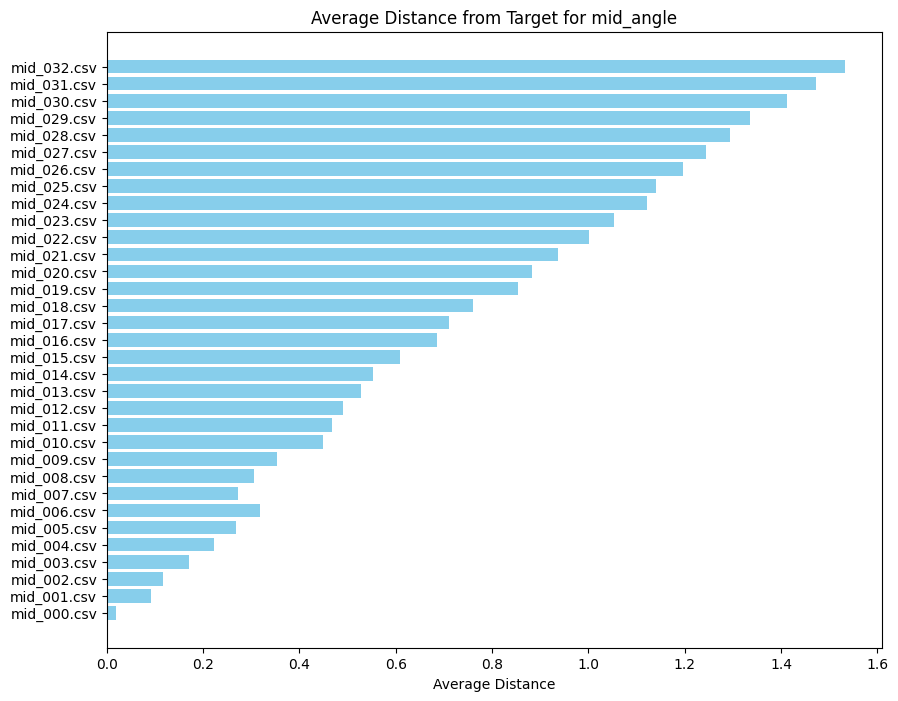

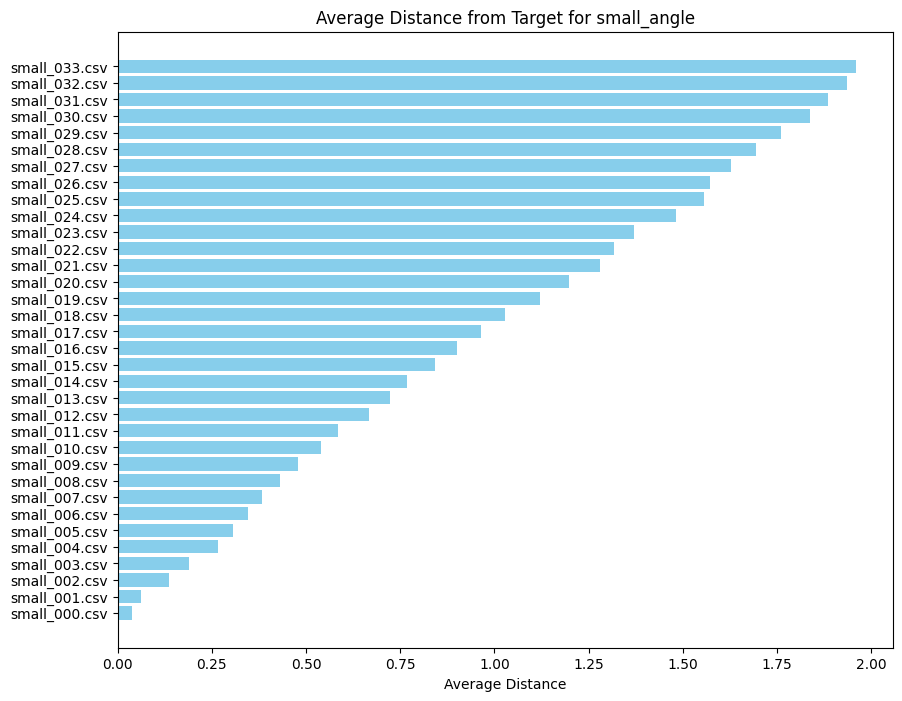

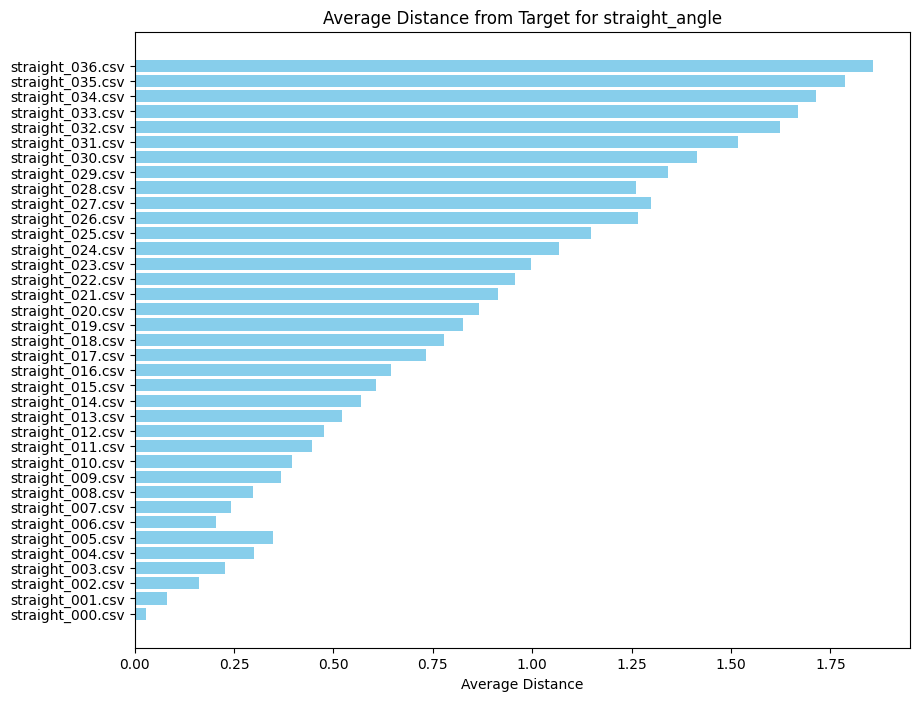

File Name Average Distance
mid_angle #mid_018.csv 0.76
mid_angle #mid_024.csv 1.12
mid_angle #mid_004.csv 0.22
mid_angle #mid_005.csv 0.27
mid_angle #mid_021.csv 0.94
mid_angle #mid_016.csv 0.68
mid_angle #mid_011.csv 0.47
mid_angle #mid_012.csv 0.49
mid_angle #mid_002.csv 0.12
mid_angle #mid_028.csv 1.29
mid_angle #mid_022.csv 1.00
mid_angle #mid_032.csv 1.53
mid_angle #mid_010.csv 0.45
mid_angle #mid_020.csv 0.88
mid_angle #mid_023.csv 1.05
mid_angle #mid_019.csv 0.85
mid_angle #mid_025.csv 1.14
mid_angle #mid_003.csv 0.17
mid_angle #mid_027.csv 1.24
mid_angle #mid_029.csv 1.34
mid_angle #mid_013.csv 0.53
mid_angle #mid_007.csv 0.27
mid_angle #mid_009.csv 0.35
mid_angle #mid_017.csv 0.71
mid_angle #mid_030.csv 1.41
mid_angle #mid_006.csv 0.32
mid_angle #mid_000.csv 0.02
mid_angle #mid_008.csv 0.30
mid_angle #mid_015.csv 0.61
mid_angle #mid_031.csv 1.47
mid_angle #mid_001.csv 0.09
mid_angle #mid_026.csv 1.20
mid_angle #mid_014.csv 0.55
small_angle #small_010.csv 0.54
small_angle #smal

In [12]:
import re
# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/mid_4_25',
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/small_4_25',
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/straight_4_25'
}

# Target average coordinates for distance calculation
target_x = 0.3005700284810129
target_z = 1.4883423132911402

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                time = float(row[1])  # Time at the second column
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Process each category and plot results
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    # Sort and prepare data for plotting
    labels = list(results.keys())
    values = list(results.values())

    
    plt.figure(figsize=(10, 8))
    plt.barh(labels, values, color='skyblue')
    plt.xlabel('Average Distance')
    plt.title(f'Average Distance from Target for {label}')
    plt.show()

# Print results in a tabular format
print("File Name", "Average Distance")
for key, value in distance_results.items():
    print(key, f"{value:.2f}")

In [2]:
import os
import csv
import numpy as np
import re

# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/mid_4_25',
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/small_4_25',
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.25_vicon/straight_4_25'
}

# Target average coordinates for distance calculation
target_x = 0.3005700284810129
target_z = 1.4883423132911402

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                time = float(row[1])  # Time at the second column
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Saving results to a CSV file for each category
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    csv_filename = f"{label}_real_average_distances_425.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        fieldnames = ['File Name', 'Average Distance']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for filename, avg_distance in results.items():
            writer.writerow({'File Name': filename, 'Average Distance': avg_distance})
        print(f"Results saved to {csv_filename}")


Results saved to mid_angle_real_average_distances_425.csv
Results saved to small_angle_real_average_distances_425.csv
Results saved to straight_angle_real_average_distances_425.csv


In [31]:
"""
process box x y z for straight small middle large
"""
path = '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/45degree-box.csv'
data = []
box_data = []  # This will store the [time, distance] pairs

# Variables to compute averages
total_x, total_y, total_z, total_distance = 0, 0, 0, 0
count = 0

try:
    with open(path, 'r') as file:
        csv_reader = csv.reader(file)
        next(csv_reader)  # Skip the header row
        for row in csv_reader:
            if len(row) >= 8:  # Ensure there are enough columns
                try:
                    time_box = float(row[1].replace("'", "").replace(",", "").strip())
                    x_position_box = float(row[-3].replace("'", "").replace(",", "").strip())
                    y_position_box = float(row[-2].replace("'", "").replace(",", "").strip())
                    z_position_box = float(row[-1].replace("'", "").replace(",", "").strip())
                    distance_box = np.sqrt(x_position_box**2 + y_position_box**2 + z_position_box**2)

                    # Accumulate sums for averaging
                    total_x += x_position_box
                    total_y += y_position_box
                    total_z += z_position_box
                    total_distance += distance_box
                    count += 1

                    data.append([time_box, x_position_box, y_position_box, z_position_box])
                    box_data.append([time_box, distance_box])  # Append [time, distance] to box_data
                except ValueError:
                    # Skip rows where conversion to float fails
                    continue
except FileNotFoundError:
    print("The file was not found. Check the file path and try again.")
except Exception as e:
    print(f"An error occurred: {e}")

# Print the cleaned and converted data
for item in data:
    print(item)

# Print the time and distance data
print("\nTime and Distance Data:")
for item in box_data:
    print(item)

# Calculate averages if count is not zero
avg_x = total_x / count if count > 0 else 0
avg_y = total_y / count if count > 0 else 0
avg_z = total_z / count if count > 0 else 0
avg_distance = total_distance / count if count > 0 else 0

# Print average values
print("\nAverage Values:")
print(f"Average X: {avg_x}")
print(f"Average Y: {avg_y}")
print(f"Average Z: {avg_z}")


[0.0, -0.916302, -0.285458, 2.289948]
[0.008333, -0.916545, -0.285459, 2.289931]
[0.016667, -0.916719, -0.28544, 2.289881]
[0.025, -0.916822, -0.285458, 2.289842]
[0.033333, -0.916852, -0.285451, 2.289777]
[0.041667, -0.91681, -0.28545, 2.289711]
[0.091667, -0.915109, -0.285743, 2.289402]
[0.1, -0.914605, -0.285453, 2.289428]
[0.108333, -0.914111, -0.285447, 2.289324]
[0.116667, -0.913561, -0.285439, 2.289162]
[0.125, -0.913075, -0.285429, 2.288981]
[0.133333, -0.91259, -0.285453, 2.2888]
[0.141667, -0.912096, -0.285432, 2.288591]
[0.15, -0.911587, -0.285418, 2.288371]
[0.158333, -0.911131, -0.285394, 2.28811]
[0.166667, -0.910763, -0.285382, 2.287857]
[0.175, -0.910435, -0.285394, 2.287593]
[0.183333, -0.910146, -0.285403, 2.287306]
[0.191667, -0.90991, -0.285393, 2.286967]
[0.2, -0.909734, -0.285384, 2.286639]
[0.208333, -0.909603, -0.285385, 2.2863]
[0.216667, -0.909526, -0.285355, 2.285951]
[0.225, -0.909483, -0.285335, 2.285609]
[0.233333, -0.909475, -0.285312, 2.285301]
[0.241667

In [27]:
"""
Staight
Average X: -1.149826971365639
Average Y: -0.30558109691629953
Average Z: 1.1762307995594714
Small:
Average X: -1.193459329545454
Average Y: -0.30220744318181825
Average Z: 1.2901862954545449
Middle:
Average X: -1.1866258256227764
Average Y: -0.30137498220640574
Average Z: 1.3059995160142348
Large:
Average X: -0.9053653497536946
Average Y: -0.2855015763546798
Average Z: 2.287077684729065
"""

'\nAverage X: -1.149826971365639\nAverage Y: -0.30558109691629953\nAverage Z: 1.1762307995594714\n'

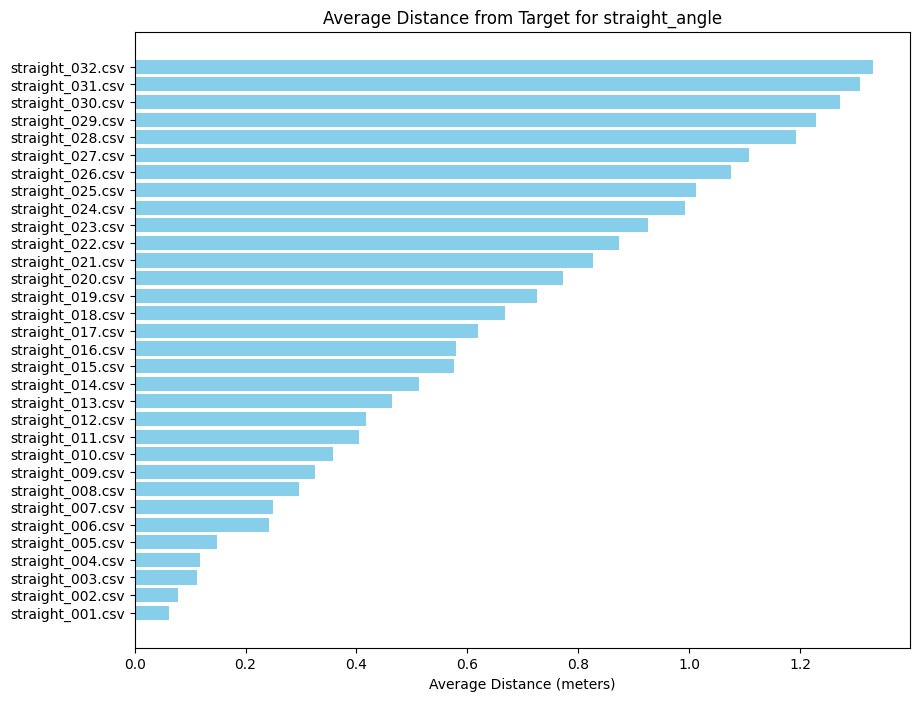

straight_001.csv: 0.06 meters
straight_002.csv: 0.08 meters
straight_003.csv: 0.11 meters
straight_004.csv: 0.12 meters
straight_005.csv: 0.15 meters
straight_006.csv: 0.24 meters
straight_007.csv: 0.25 meters
straight_008.csv: 0.30 meters
straight_009.csv: 0.33 meters
straight_010.csv: 0.36 meters
straight_011.csv: 0.41 meters
straight_012.csv: 0.42 meters
straight_013.csv: 0.46 meters
straight_014.csv: 0.51 meters
straight_015.csv: 0.58 meters
straight_016.csv: 0.58 meters
straight_017.csv: 0.62 meters
straight_018.csv: 0.67 meters
straight_019.csv: 0.73 meters
straight_020.csv: 0.77 meters
straight_021.csv: 0.83 meters
straight_022.csv: 0.87 meters
straight_023.csv: 0.93 meters
straight_024.csv: 0.99 meters
straight_025.csv: 1.01 meters
straight_026.csv: 1.08 meters
straight_027.csv: 1.11 meters
straight_028.csv: 1.19 meters
straight_029.csv: 1.23 meters
straight_030.csv: 1.27 meters
straight_031.csv: 1.31 meters
straight_032.csv: 1.33 meters


In [42]:
import re
# Define paths to folders containing CSV files
paths = {
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Straight-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.149826971365639
target_z = 1.1762307995594714

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Process each category and plot results
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    # Sort and prepare data for plotting
    labels = list(results.keys())
    values = list(results.values())

    plt.figure(figsize=(10, 8))
    plt.barh(labels, values, color='skyblue')
    plt.xlabel('Average Distance (meters)')
    plt.title(f'Average Distance from Target for {label}')
    plt.show()

    # Print results
    for label, value in results.items():
        print(f"{label}: {value:.2f} meters")

In [5]:
import os
import csv
import numpy as np
import re

# Define paths to folders containing CSV files
paths = {
    'straight_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Straight-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.149826971365639
target_z = 1.1762307995594714

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Saving results to a CSV file for each category
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    csv_filename = f"{label}_real_average_distances_428.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        fieldnames = ['File Name', 'Average Distance (meters)']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for filename, avg_distance in results.items():
            writer.writerow({'File Name': filename, 'Average Distance (meters)': avg_distance})
        print(f"Results saved to {csv_filename}")

    # Optionally print results
    print(f"Results for {label}:")
    for filename, avg_distance in results.items():
        print(f"{filename}: {avg_distance:.2f} meters")


Results saved to straight_angle_real_average_distances_428.csv
Results for straight_angle:
straight_001.csv: 0.06 meters
straight_002.csv: 0.08 meters
straight_003.csv: 0.11 meters
straight_004.csv: 0.12 meters
straight_005.csv: 0.15 meters
straight_006.csv: 0.24 meters
straight_007.csv: 0.25 meters
straight_008.csv: 0.30 meters
straight_009.csv: 0.33 meters
straight_010.csv: 0.36 meters
straight_011.csv: 0.41 meters
straight_012.csv: 0.42 meters
straight_013.csv: 0.46 meters
straight_014.csv: 0.51 meters
straight_015.csv: 0.58 meters
straight_016.csv: 0.58 meters
straight_017.csv: 0.62 meters
straight_018.csv: 0.67 meters
straight_019.csv: 0.73 meters
straight_020.csv: 0.77 meters
straight_021.csv: 0.83 meters
straight_022.csv: 0.87 meters
straight_023.csv: 0.93 meters
straight_024.csv: 0.99 meters
straight_025.csv: 1.01 meters
straight_026.csv: 1.08 meters
straight_027.csv: 1.11 meters
straight_028.csv: 1.19 meters
straight_029.csv: 1.23 meters
straight_030.csv: 1.27 meters
straight_

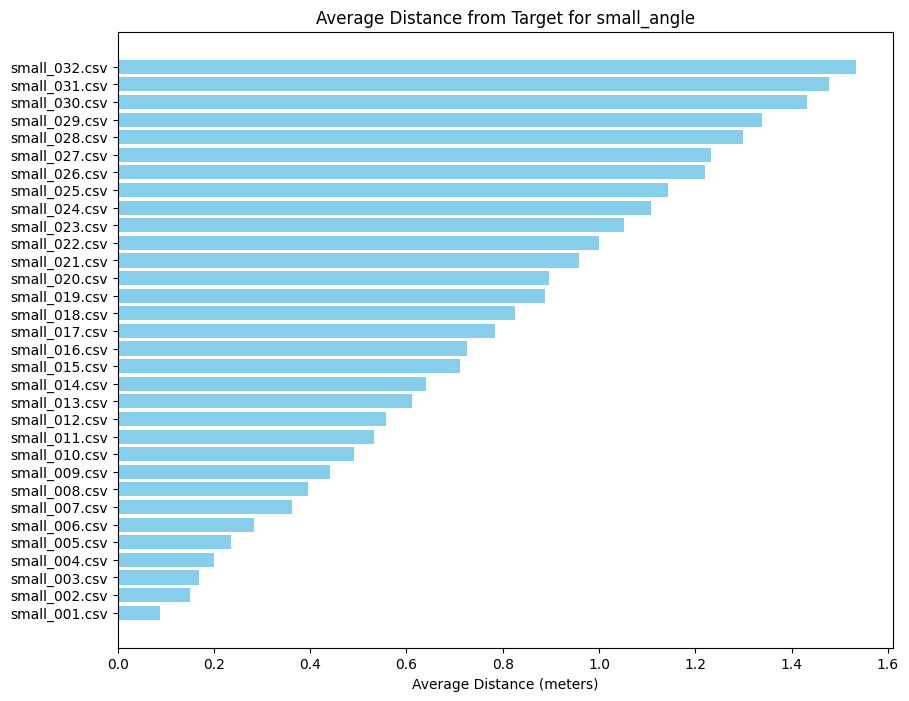

small_001.csv: 0.09 meters
small_002.csv: 0.15 meters
small_003.csv: 0.17 meters
small_004.csv: 0.20 meters
small_005.csv: 0.24 meters
small_006.csv: 0.28 meters
small_007.csv: 0.36 meters
small_008.csv: 0.40 meters
small_009.csv: 0.44 meters
small_010.csv: 0.49 meters
small_011.csv: 0.53 meters
small_012.csv: 0.56 meters
small_013.csv: 0.61 meters
small_014.csv: 0.64 meters
small_015.csv: 0.71 meters
small_016.csv: 0.73 meters
small_017.csv: 0.78 meters
small_018.csv: 0.83 meters
small_019.csv: 0.89 meters
small_020.csv: 0.90 meters
small_021.csv: 0.96 meters
small_022.csv: 1.00 meters
small_023.csv: 1.05 meters
small_024.csv: 1.11 meters
small_025.csv: 1.14 meters
small_026.csv: 1.22 meters
small_027.csv: 1.23 meters
small_028.csv: 1.30 meters
small_029.csv: 1.34 meters
small_030.csv: 1.43 meters
small_031.csv: 1.48 meters
small_032.csv: 1.53 meters


In [43]:
import re
# Define paths to folders containing CSV files
paths = {
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Small-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.193459329545454
target_z = 1.2901862954545449

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Process each category and plot results
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    # Sort and prepare data for plotting
    labels = list(results.keys())
    values = list(results.values())

    plt.figure(figsize=(10, 8))
    plt.barh(labels, values, color='skyblue')
    plt.xlabel('Average Distance (meters)')
    plt.title(f'Average Distance from Target for {label}')
    plt.show()

    # Print results
    for label, value in results.items():
        print(f"{label}: {value:.2f} meters")

In [6]:
import os
import csv
import numpy as np
import re

# Define paths to folders containing CSV files
paths = {
    'small_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Small-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.193459329545454
target_z = 1.2901862954545449

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Saving results to a CSV file for each category
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    csv_filename = f"{label}_real_average_distances_428.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        fieldnames = ['File Name', 'Average Distance (meters)']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for filename, avg_distance in results.items():
            writer.writerow({'File Name': filename, 'Average Distance (meters)': avg_distance})
        print(f"Results saved to {csv_filename}")

    # Optionally print results
    print(f"Results for {label}:")
    for filename, avg_distance in results.items():
        print(f"{filename}: {avg_distance:.2f} meters")


Results saved to small_angle_real_average_distances_428.csv
Results for small_angle:
small_001.csv: 0.09 meters
small_002.csv: 0.15 meters
small_003.csv: 0.17 meters
small_004.csv: 0.20 meters
small_005.csv: 0.24 meters
small_006.csv: 0.28 meters
small_007.csv: 0.36 meters
small_008.csv: 0.40 meters
small_009.csv: 0.44 meters
small_010.csv: 0.49 meters
small_011.csv: 0.53 meters
small_012.csv: 0.56 meters
small_013.csv: 0.61 meters
small_014.csv: 0.64 meters
small_015.csv: 0.71 meters
small_016.csv: 0.73 meters
small_017.csv: 0.78 meters
small_018.csv: 0.83 meters
small_019.csv: 0.89 meters
small_020.csv: 0.90 meters
small_021.csv: 0.96 meters
small_022.csv: 1.00 meters
small_023.csv: 1.05 meters
small_024.csv: 1.11 meters
small_025.csv: 1.14 meters
small_026.csv: 1.22 meters
small_027.csv: 1.23 meters
small_028.csv: 1.30 meters
small_029.csv: 1.34 meters
small_030.csv: 1.43 meters
small_031.csv: 1.48 meters
small_032.csv: 1.53 meters


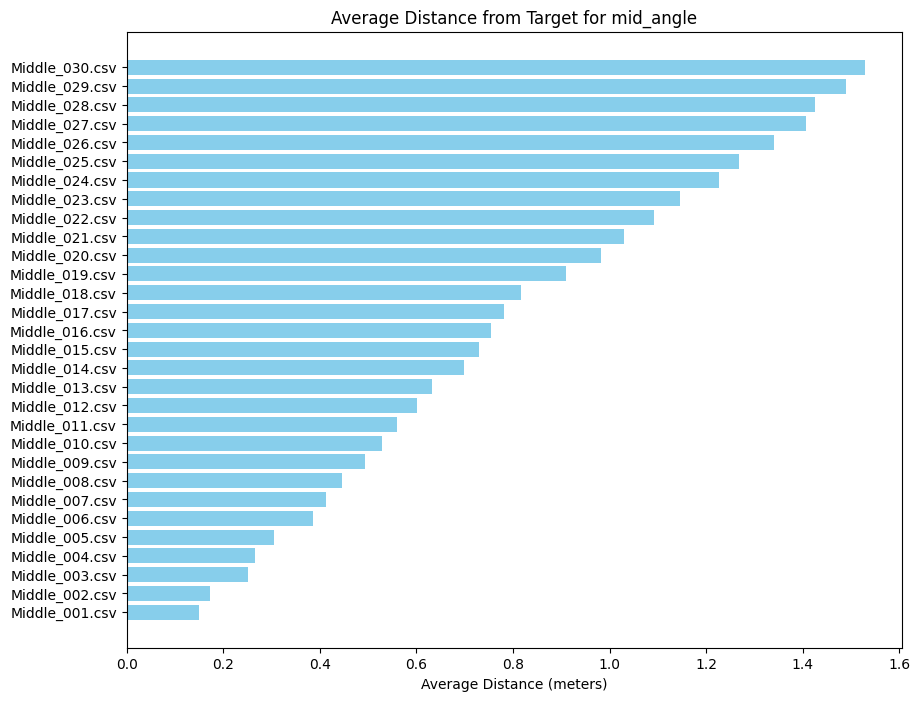

Middle_001.csv: 0.15 meters
Middle_002.csv: 0.17 meters
Middle_003.csv: 0.25 meters
Middle_004.csv: 0.27 meters
Middle_005.csv: 0.31 meters
Middle_006.csv: 0.39 meters
Middle_007.csv: 0.41 meters
Middle_008.csv: 0.45 meters
Middle_009.csv: 0.49 meters
Middle_010.csv: 0.53 meters
Middle_011.csv: 0.56 meters
Middle_012.csv: 0.60 meters
Middle_013.csv: 0.63 meters
Middle_014.csv: 0.70 meters
Middle_015.csv: 0.73 meters
Middle_016.csv: 0.75 meters
Middle_017.csv: 0.78 meters
Middle_018.csv: 0.82 meters
Middle_019.csv: 0.91 meters
Middle_020.csv: 0.98 meters
Middle_021.csv: 1.03 meters
Middle_022.csv: 1.09 meters
Middle_023.csv: 1.15 meters
Middle_024.csv: 1.23 meters
Middle_025.csv: 1.27 meters
Middle_026.csv: 1.34 meters
Middle_027.csv: 1.41 meters
Middle_028.csv: 1.43 meters
Middle_029.csv: 1.49 meters
Middle_030.csv: 1.53 meters


In [44]:
import re
# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Middle-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.1866258256227764
target_z = 1.3059995160142348

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Process each category and plot results
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    # Sort and prepare data for plotting
    labels = list(results.keys())
    values = list(results.values())

    plt.figure(figsize=(10, 8))
    plt.barh(labels, values, color='skyblue')
    plt.xlabel('Average Distance (meters)')
    plt.title(f'Average Distance from Target for {label}')
    plt.show()

    # Print results
    for label, value in results.items():
        print(f"{label}: {value:.2f} meters")

In [7]:
import os
import csv
import numpy as np
import re

# Define paths to folders containing CSV files
paths = {
    'mid_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/Middle-4-28'
}

# Target average coordinates for distance calculation
target_x = -1.1866258256227764
target_z = 1.3059995160142348

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Saving results to a CSV file for each category
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    csv_filename = f"{label}_real_average_distances_428.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        fieldnames = ['File Name', 'Average Distance (meters)']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for filename, avg_distance in results.items():
            writer.writerow({'File Name': filename, 'Average Distance (meters)': avg_distance})
        print(f"Results saved to {csv_filename}")

    # Optionally print results
    print(f"Results for {label}:")
    for filename, avg_distance in results.items():
        print(f"{filename}: {avg_distance:.2f} meters")


Results saved to mid_angle_real_average_distances_428.csv
Results for mid_angle:
Middle_001.csv: 0.15 meters
Middle_002.csv: 0.17 meters
Middle_003.csv: 0.25 meters
Middle_004.csv: 0.27 meters
Middle_005.csv: 0.31 meters
Middle_006.csv: 0.39 meters
Middle_007.csv: 0.41 meters
Middle_008.csv: 0.45 meters
Middle_009.csv: 0.49 meters
Middle_010.csv: 0.53 meters
Middle_011.csv: 0.56 meters
Middle_012.csv: 0.60 meters
Middle_013.csv: 0.63 meters
Middle_014.csv: 0.70 meters
Middle_015.csv: 0.73 meters
Middle_016.csv: 0.75 meters
Middle_017.csv: 0.78 meters
Middle_018.csv: 0.82 meters
Middle_019.csv: 0.91 meters
Middle_020.csv: 0.98 meters
Middle_021.csv: 1.03 meters
Middle_022.csv: 1.09 meters
Middle_023.csv: 1.15 meters
Middle_024.csv: 1.23 meters
Middle_025.csv: 1.27 meters
Middle_026.csv: 1.34 meters
Middle_027.csv: 1.41 meters
Middle_028.csv: 1.43 meters
Middle_029.csv: 1.49 meters
Middle_030.csv: 1.53 meters


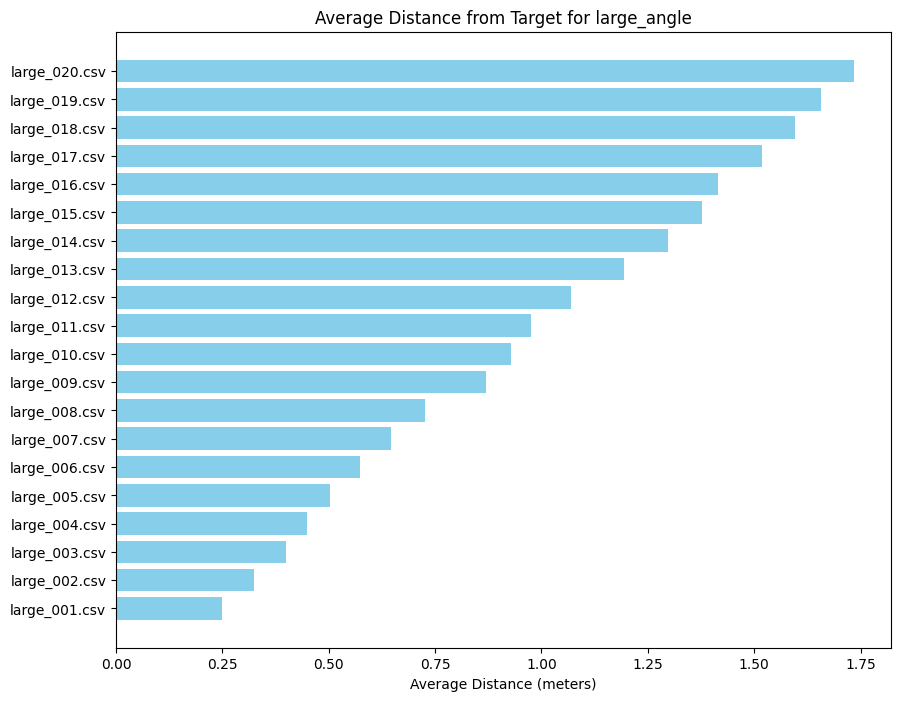

large_001.csv: 0.25 meters
large_002.csv: 0.32 meters
large_003.csv: 0.40 meters
large_004.csv: 0.45 meters
large_005.csv: 0.50 meters
large_006.csv: 0.57 meters
large_007.csv: 0.65 meters
large_008.csv: 0.73 meters
large_009.csv: 0.87 meters
large_010.csv: 0.93 meters
large_011.csv: 0.97 meters
large_012.csv: 1.07 meters
large_013.csv: 1.20 meters
large_014.csv: 1.30 meters
large_015.csv: 1.38 meters
large_016.csv: 1.42 meters
large_017.csv: 1.52 meters
large_018.csv: 1.60 meters
large_019.csv: 1.66 meters
large_020.csv: 1.73 meters


In [40]:
# Define paths to folders containing CSV files
paths = {
    'large_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/45degree-4-28'
}

# Target average coordinates for distance calculation
target_x = -0.9053653497536946
target_z = 2.287077684729065

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Process each category and plot results
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    # Sort and prepare data for plotting
    labels = list(results.keys())
    values = list(results.values())

    plt.figure(figsize=(10, 8))
    plt.barh(labels, values, color='skyblue')
    plt.xlabel('Average Distance (meters)')
    plt.title(f'Average Distance from Target for {label}')
    plt.show()

    # Print results
    for label, value in results.items():
        print(f"{label}: {value:.2f} meters")

In [8]:
import os
import csv
import numpy as np
import re

# Define paths to folders containing CSV files
paths = {
    'large_angle': '/home/tiantan/Documents/Apriltag_distance_detection/data/4.28_vicon/45degree-4-28'
}

# Target average coordinates for distance calculation
target_x = -0.9053653497536946
target_z = 2.287077684729065

# Function to extract numbers for sorting purposes
def extract_numbers(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else 0

# Function to process CSV files and calculate average distances
def process_csv_files_in_folder(folder, label):
    distance_results = {}
    for filename in os.listdir(folder):
        if filename.endswith('.csv') and not filename.startswith('._'):
            path = os.path.join(folder, filename)
            file_data = []
            try:
                with open(path, 'r', encoding='utf-8') as file:
                    csv_reader = csv.reader(file)
                    headers = next(csv_reader)  # Capture the header row

                    for row in csv_reader:
                        if len(row) >= 16:  # Ensure row has enough columns
                            try:
                                x = float(row[-3])  # X position in the third last column
                                z = float(row[-1])  # Z position in the last column
                                file_data.append((x, z))
                            except ValueError:
                                continue

                if file_data:
                    # Calculate distances from the target point using X and Z
                    distances = [np.sqrt((x - target_x)**2 + (z - target_z)**2) for x, z in file_data]
                    average_distance = np.mean(distances)

                    # Store average distance in results dictionary
                    distance_results[filename] = average_distance

            except FileNotFoundError:
                print(f"The file {path} was not found.")
            except UnicodeDecodeError:
                print(f"Unicode decode error in {path}. Check the file encoding.")
            except Exception as e:
                print(f"An error occurred while processing {path}: {e}")

    # Sort results by filename numbers
    sorted_results = {k: v for k, v in sorted(distance_results.items(), key=lambda item: extract_numbers(item[0]))}
    return sorted_results

# Saving results to a CSV file for each category
for label, folder_path in paths.items():
    results = process_csv_files_in_folder(folder_path, label)
    csv_filename = f"{label}_real_average_distances_428.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        fieldnames = ['File Name', 'Average Distance (meters)']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for filename, avg_distance in results.items():
            writer.writerow({'File Name': filename, 'Average Distance (meters)': avg_distance})
        print(f"Results saved to {csv_filename}")

    # Optionally print results
    print(f"Results for {label}:")
    for filename, avg_distance in results.items():
        print(f"{filename}: {avg_distance:.2f} meters")


Results saved to large_angle_real_average_distances_428.csv
Results for large_angle:
large_001.csv: 0.25 meters
large_002.csv: 0.32 meters
large_003.csv: 0.40 meters
large_004.csv: 0.45 meters
large_005.csv: 0.50 meters
large_006.csv: 0.57 meters
large_007.csv: 0.65 meters
large_008.csv: 0.73 meters
large_009.csv: 0.87 meters
large_010.csv: 0.93 meters
large_011.csv: 0.97 meters
large_012.csv: 1.07 meters
large_013.csv: 1.20 meters
large_014.csv: 1.30 meters
large_015.csv: 1.38 meters
large_016.csv: 1.42 meters
large_017.csv: 1.52 meters
large_018.csv: 1.60 meters
large_019.csv: 1.66 meters
large_020.csv: 1.73 meters
